<h1>Prototyp Data Input</h1>
Erstellt am 12.04.2022 von Christian T. Seidler
<br>Zweck: Einlesen und grafische Darstellung der wichtigsten Signalparameter aller Bearings des FEMTO Bearing Data Sets.

In [1]:
import numpy as np
import pandas as pd
from scipy.stats import entropy

import matplotlib.pyplot as plt
import time
import os

In [2]:
# Datenpfad anlegen
path = r'D:\HS Albstadt\Sommersemester 2022\Machine Learning in Manufacturing\Semesterbegleitendes Projekt\Data\Input'

learning_sets = {'Bearing1_1': 2803,
                 'Bearing1_2': 871,
                 'Bearing2_1': 911,
                 'Bearing2_2': 797,
                 'Bearing3_1': 515,
                 'Bearing3_2': 1637}

test_sets = {'Bearing1_3': 1802,
             'Bearing1_4': 1139,
             'Bearing1_5': 2302,
             'Bearing1_6': 2302,
             'Bearing1_7': 1502,
             'Bearing2_3': 1202,
             'Bearing2_4': 612,
             'Bearing2_5': 2002,
             'Bearing2_6': 572,
             'Bearing2_7': 172,
             'Bearing3_3': 352}

In [3]:
# Funktion, um eine Messung einzulesen und als pd.Dataframe zurückzugeben
def read_single_measurement(filepath):
    # Nur die letzten beiden Spalten einlesen, da diese die Messdaten in x- und y-Richtung enthalten
    measurement = pd.read_csv(filepath, sep=',', header=None, usecols=[4, 5])
    
    # Header umbenennen
    measurement.rename(columns={4: 'acc_x', 5: 'acc_y'}, inplace=True)
    
    return measurement

In [4]:
# Funktion, um aus den Messdaten die interessanten Informationen zu extrahieren
def calc_signal_params(data):
    cols = ['acc_x', 'acc_y']
    
    # Mittelwert
    mean_x, mean_y = data[cols].mean()
    
    # Absoluter Mittelwert
    abs_mean_x, abs_mean_y = data[cols].abs().mean()
    
    # Standardabweichung
    std_x, std_y = data[cols].std()
    
    # Schiefe - Skew
    skew_x, skew_y = data[cols].skew()
    
    # Kurtosis
    kurtosis_x, kurtosis_y = data[cols].kurtosis()

    # RMS
    rms_x, rms_y = np.sqrt((data[cols]**2).sum() / len(data[cols]))
    
    # Absoluter maximaler Wert
    abs_max_x, abs_max_y = data[cols].abs().max()
    
    # Amplitude - Peak-to-Peak
    p2p_x, p2p_y = data[cols].abs().max() - data[cols].abs().min()
    
    # Crest Faktor
    crest_x = abs_max_x / rms_x
    crest_y = abs_max_y / rms_y
    
    # Shape Faktor
    shape_x = rms_x / abs_mean_x
    shape_y = rms_y / abs_mean_y
    
    # Impulse
    impulse_x = abs_max_x / abs_mean_x
    impulse_y = abs_max_y / abs_mean_y
        
    # Clearance Faktor
    clearance_x, clearance_y = ((np.sqrt(data[cols].abs())).sum() / len(data[cols]))**2
    
    # Entropie einfügen
    entropy_x = entropy(pd.cut(data[cols[0]], 500).value_counts())
    entropy_y = entropy(pd.cut(data[cols[1]], 500).value_counts())
    
    # Gleitender Mittelwert
    rolling_mean_x = np.nanmax(data[cols[0]]
                               .rolling(640)
                               .mean()
                               )
    rolling_mean_y = np.nanmax(data[cols[1]]
                               .rolling(640)
                               .mean()
                               )

    # Absoluter gleitender Mittelwert
    abs_rolling_mean_x = np.nanmax(data[cols[0]]
                                   .abs()
                                   .rolling(640)
                                   .mean()
                                   )
    abs_rolling_mean_y = np.nanmax(data[cols[1]]
                                   .abs()
                                   .rolling(640)
                                   .mean()
                                   )
    
    
    # DataFrame aufbauen
    signal_params = pd.DataFrame({'mean_acc_x': [], 'mean_acc_y': [],
                                  'abs_mean_x': [], 'abs_mean_y': [],
                                  'std_x': [], 'std_y': [],
                                  'skew_x': [], 'skew_y': [],
                                  'kurtosis_x': [], 'kurtosis_y': [],
                                  'rms_x': [], 'rms_y': [],
                                  'abs_max_x': [], 'abs_max_y': [],
                                  'p2p_x': [], 'p2p_y': [],
                                  'crest_x': [], 'crest_y': [],
                                  'shape_x': [], 'shape_y': [],
                                  'impulse_x': [], 'impulse_y': [],
                                  'clearance_x': [], 'clearance_y': [],
                                  'entropy_x': [], 'entropy_y': [],
                                  'rolling_mean_x': [], 'rolling_mean_y': [],
                                  'abs_rolling_mean_x': [],
                                  'abs_rolling_mean_y': []})

    # DataFrame mit berechneten Parametern befüllen
    signal_params.loc[0] = [mean_x, mean_y,
                            abs_mean_x, abs_mean_y,
                            std_x, std_y,
                            skew_x, skew_y,
                            kurtosis_x, kurtosis_y,
                            rms_x, rms_y,
                            abs_max_x, abs_max_y,
                            p2p_x, p2p_y,
                            crest_x, crest_y,
                            shape_x, shape_y,
                            impulse_x, impulse_y,
                            clearance_x, clearance_y,
                            entropy_x, entropy_y,
                            rolling_mean_x, rolling_mean_y,
                            abs_rolling_mean_x, abs_rolling_mean_y]
    
    return signal_params

In [5]:
# Funktion, um automatisiert alle Messungen einzulesen
def read_bearing_measurements(filepath, start=1, end=1, step=1):
    data = pd.DataFrame()
    
    # Filepath automatisiert anpassen
    for i in range(start, end+1, step):
        if i < 10:
            document = r'\acc_0000' + str(i) + '.csv'
        elif 10 <= i < 100:
            document = r'\acc_000' + str(i) + '.csv'
        elif 100 <= i < 1000:
            document = r'\acc_00' + str(i) + '.csv'
        else:
            document = r'\acc_0' + str(i) + '.csv'
            
        path = filepath + document

        # Messdaten einlesen
        input_df = read_single_measurement(path)
        
        # Extrahieren der Signalinformationen aus den Messdaten
        signal_params = calc_signal_params(input_df)
        
        # Anhängen der Daten an den DataFrame
        data = pd.concat([data, signal_params], ignore_index=True)
        
    return data    

In [6]:
# Funktion, um grundlegende Informationen eines Dataframes auszugeben
def print_df_infos(df):
    print(df.describe(), end='\n\n')
    print(df.head(), end='\n\n')
    print(df.tail(), end='\n\n')
    print(df.info(), end='\n\n')

In [7]:
# Funktion, um die berechneten Signalparameter grafisch anzuzeigen
def plot_signal_params(df, figsize=(24, 25)):
    fig, axes = plt.subplots(nrows=15, ncols=1, figsize=figsize, sharex=True)

    # Bearing 1_1
    df.plot(y=[0, 1], ax=axes[0], title='Mittelwert')
    df.plot(y=[2, 3], ax=axes[1], title='Absoluter Mittelwert')
    df.plot(y=[4, 5], ax=axes[2], title='Standardabweichung')
    df.plot(y=[6, 7], ax=axes[3], title='Schiefe')
    df.plot(y=[8, 9], ax=axes[4], title='Kurtosis')
    df.plot(y=[10, 11], ax=axes[5], title='RMS')
    df.plot(y=[12, 13], ax=axes[6], title='Absoluter maximaler Wert')
    df.plot(y=[14, 15], ax=axes[7], title='Peak-to-Peak')
    df.plot(y=[16, 17], ax=axes[8], title='Crest-Faktor')
    df.plot(y=[18, 19], ax=axes[9], title='Shape-Faktor')
    df.plot(y=[20, 21], ax=axes[10], title='Impuls')
    df.plot(y=[22, 23], ax=axes[11], title='Clearance-Faktor')
    df.plot(y=[24, 25], ax=axes[12], title='Entropie')
    df.plot(y=[26, 27], ax=axes[13], title='Gleitender Mittelwert')
    df.plot(y=[28, 29], ax=axes[14], title='Absolut gleitender Mittelwert')

    plt.show()

<h3>Condition 1</h3>

<h5>Bearing 1_1 (Lernset)</h5>

In [8]:
file = os.path.join(path, 'Learning_set', 'Bearing1_1')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing1_1'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 297.1698181629181

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y        std_x  \
count  2803.000000  2803.000000  2803.000000  2803.000000  2803.000000   
mean      0.001169     0.000950     0.505178     0.372544     0.676364   
std       0.012597     0.023840     0.361266     0.214666     0.565143   
min      -0.279888    -0.507520     0.233700     0.253855     0.292975   
25%      -0.004312    -0.007811     0.280246     0.291906     0.352973   
50%       0.001230     0.001316     0.381663     0.338188     0.487546   
75%       0.007040     0.010894     0.627544     0.382710     0.835327   
max       0.141195     0.228236     3.937015     3.391389     6.708256   

             std_y       skew_x       skew_y   kurtosis_x   kurtosis_y  ...  \
count  2803.000000  2803.000000  2803.000000  2803.000000  2803.000000  ...   
mean      0.479034    -0.091141    -0.053088     1.278442     1.343702  ...   
std       0.314020     0.265698     0.613395     2.623766

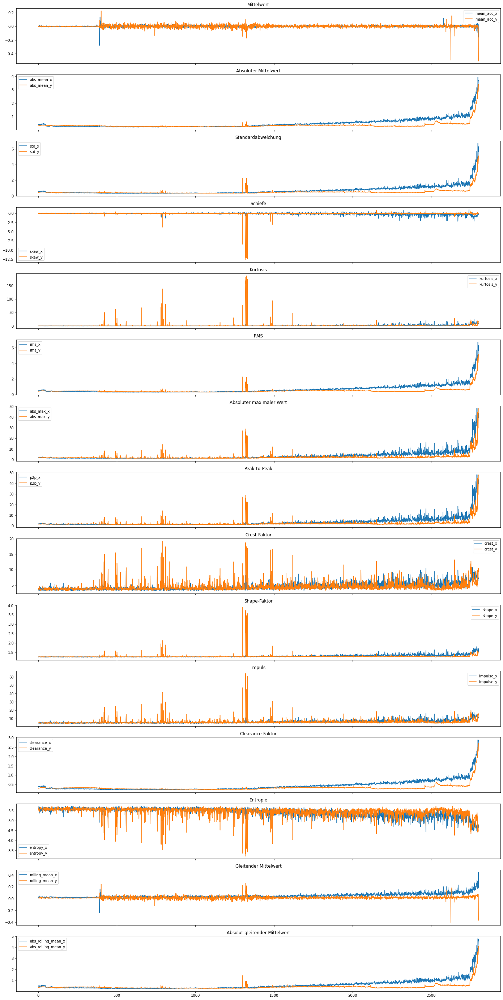

In [9]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 1_2 (Lernset)</h5>

In [10]:
file = os.path.join(path, 'Learning_set', 'Bearing1_2')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing1_2'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 81.16659808158875

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y       std_x       std_y  \
count  871.000000  871.000000  871.000000  871.000000  871.000000  871.000000   
mean     0.000647    0.002405    0.294408    0.441110    0.392688    0.642759   
std      0.028284    0.021955    0.165515    0.264844    0.231425    0.386694   
min     -0.145548   -0.067641    0.215814    0.320244    0.270812    0.401989   
25%     -0.017090   -0.011267    0.240092    0.348424    0.305782    0.440892   
50%      0.000662    0.002686    0.256160    0.382488    0.333078    0.502432   
75%      0.016835    0.016303    0.274337    0.422266    0.377355    0.675380   
max      0.157293    0.066767    1.539368    2.947015    2.234733    4.068622   

           skew_x      skew_y  kurtosis_x  kurtosis_y  ...   impulse_x  \
count  871.000000  871.000000  871.000000  871.000000  ...  871.000000   
mean    -0.350435   -0.070776   10.257715   36.951002  ...    9.908957   
std      

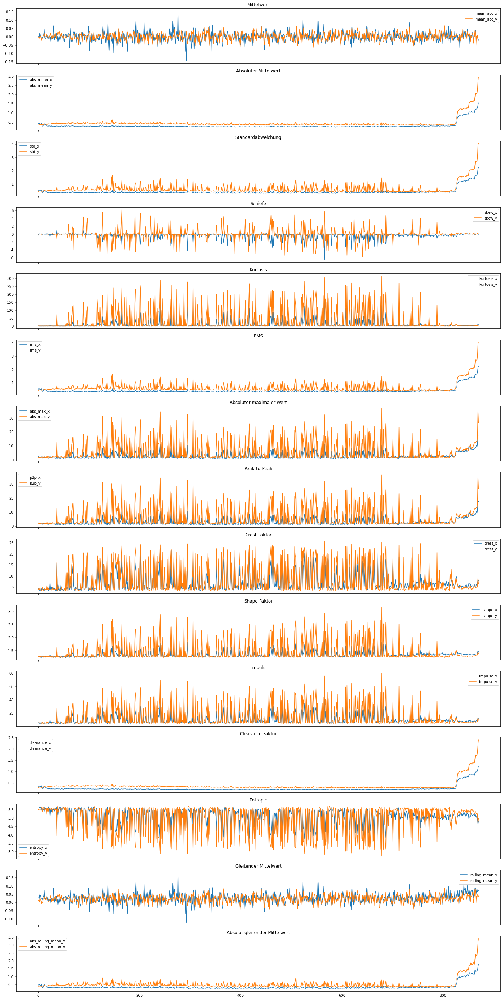

In [11]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 1_3 (Testset)</h5>

In [12]:
file = os.path.join(path, 'Test_set', 'Bearing1_3')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_3'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 167.66219782829285

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y        std_x  \
count  1802.000000  1802.000000  1802.000000  1802.000000  1802.000000   
mean      0.001338     0.002399     0.341162     0.307710     0.434449   
std       0.023026     0.073138     0.098487     0.206173     0.134171   
min      -0.117759    -1.009009     0.251545     0.224877     0.316717   
25%      -0.013631    -0.015066     0.281029     0.250375     0.353873   
50%       0.002230     0.001622     0.298688     0.274034     0.378075   
75%       0.016413     0.019682     0.357242     0.298865     0.451995   
max       0.100530     1.098846     0.945489     3.837163     1.664703   

             std_y       skew_x       skew_y   kurtosis_x   kurtosis_y  ...  \
count  1802.000000  1802.000000  1802.000000  1802.000000  1802.000000  ...   
mean      0.435956    -0.058692    -0.435791     0.620135     5.539840  ...   
std       0.441411     0.188725     1.706498     1.83597

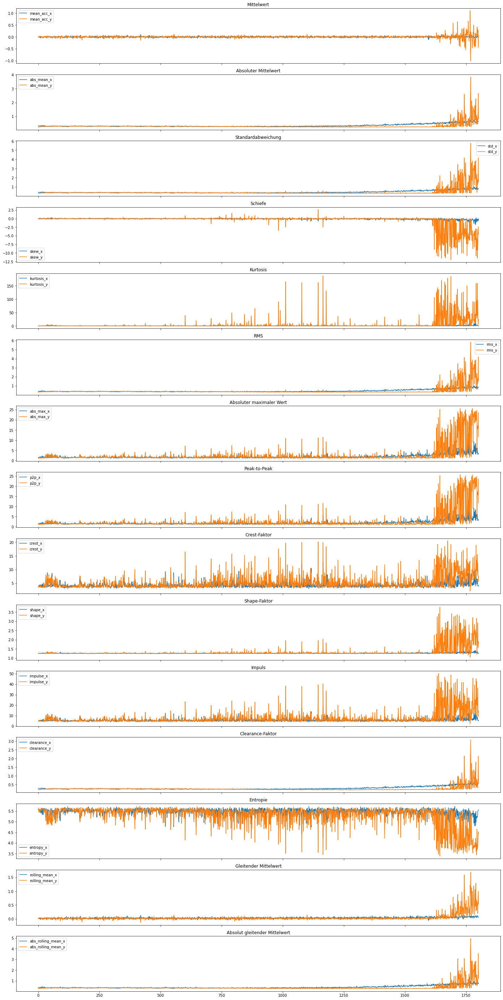

In [13]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 1_4 (Testset)</h5>

In [14]:
file = os.path.join(path, 'Test_set', 'Bearing1_4')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_4'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 102.54763579368591

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y        std_x  \
count  1139.000000  1139.000000  1139.000000  1139.000000  1139.000000   
mean      0.001290     0.000916     0.361623     0.518126     0.461259   
std       0.016575     0.019771     0.261548     0.334898     0.361665   
min      -0.080755    -0.204734     0.264945     0.359185     0.331753   
25%      -0.009297    -0.010759     0.292412     0.415473     0.366789   
50%       0.001704     0.000568     0.306127     0.446862     0.384823   
75%       0.012173     0.012062     0.323913     0.493268     0.406647   
max       0.059528     0.099792     2.142691     2.955289     3.014874   

             std_y       skew_x       skew_y   kurtosis_x   kurtosis_y  ...  \
count  1139.000000  1139.000000  1139.000000  1139.000000  1139.000000  ...   
mean      0.655095    -0.019928    -0.002692     0.261285     0.142360  ...   
std       0.442194     0.079164     0.053829     1.18906

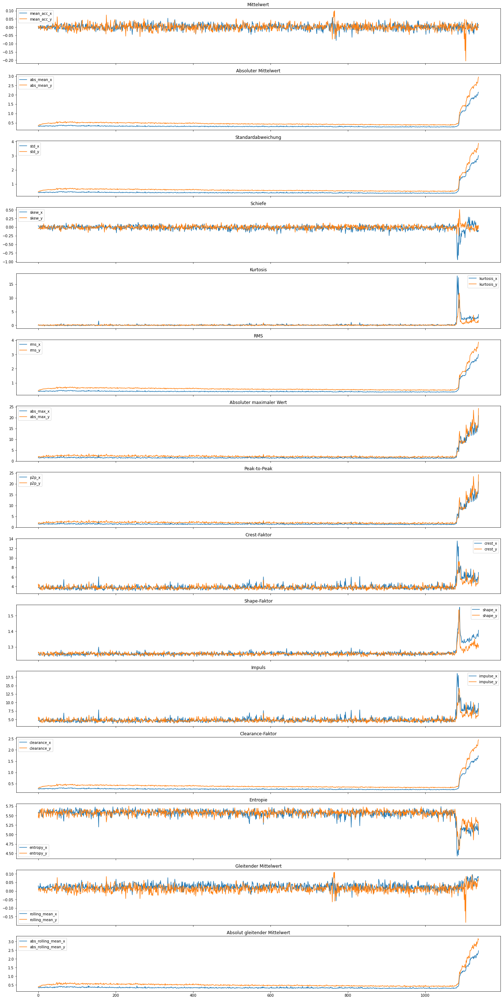

In [15]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 1_5 (Testset)</h5>

In [16]:
file = os.path.join(path, 'Test_set', 'Bearing1_5')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_5'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 218.97929453849792

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y        std_x  \
count  2302.000000  2302.000000  2302.000000  2302.000000  2302.000000   
mean      0.001897     0.001712     0.227165     0.355279     0.285381   
std       0.022227     0.014351     0.028438     0.030773     0.035638   
min      -0.092540    -0.071348     0.188460     0.285918     0.236707   
25%      -0.011931    -0.007610     0.205621     0.332547     0.258218   
50%       0.001837     0.001772     0.216590     0.344958     0.272086   
75%       0.015118     0.011087     0.242222     0.371728     0.304744   
max       0.090289     0.060324     0.331138     0.468571     0.419569   

             std_y       skew_x       skew_y   kurtosis_x   kurtosis_y  ...  \
count  2302.000000  2302.000000  2302.000000  2302.000000  2302.000000  ...   
mean      0.445989    -0.012094     0.008203     0.185269     0.163304  ...   
std       0.039447     0.073297     0.073780     0.36535

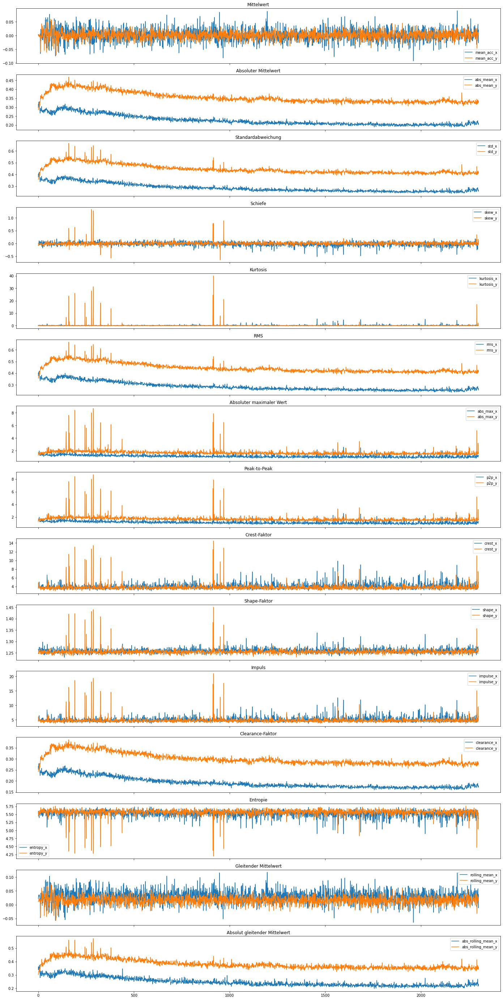

In [17]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 1_6 (Testset)</h5>

In [18]:
file = os.path.join(path, 'Test_set', 'Bearing1_6')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_6'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 210.7530858516693

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y        std_x  \
count  2302.000000  2302.000000  2302.000000  2302.000000  2302.000000   
mean      0.001039     0.001982     0.284167     0.322720     0.370317   
std       0.017563     0.024332     0.035180     0.038372     0.057662   
min      -0.066064    -0.098398     0.220761     0.266991     0.280624   
25%      -0.010976    -0.013378     0.260561     0.295470     0.336762   
50%       0.001213     0.001562     0.275118     0.307589     0.358557   
75%       0.013140     0.017635     0.301300     0.341290     0.392232   
max       0.054985     0.086150     0.519092     0.479879     0.933462   

             std_y       skew_x       skew_y   kurtosis_x   kurtosis_y  ...  \
count  2302.000000  2302.000000  2302.000000  2302.000000  2302.000000  ...   
mean      0.412976    -0.029271     0.036417     2.047579     3.211523  ...   
std       0.067890     0.179125     0.391862     5.977000

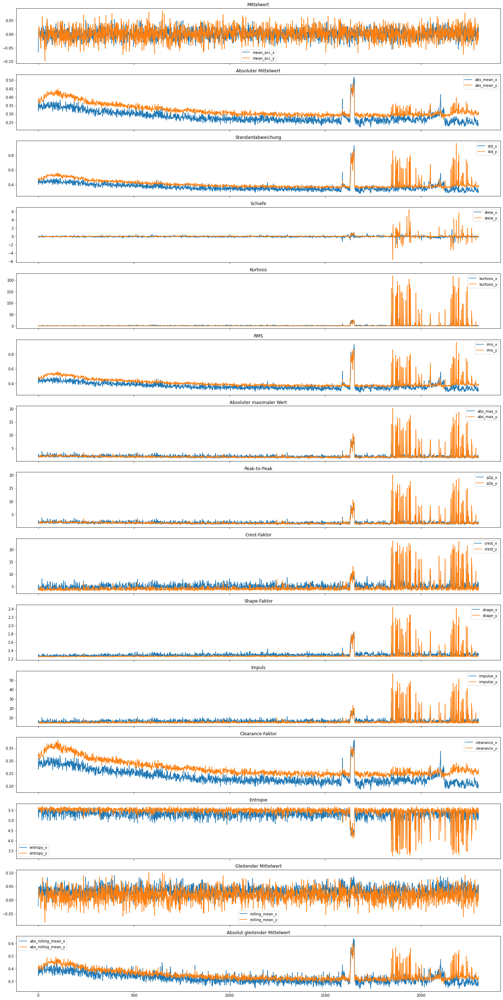

In [19]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 1_7 (Testset)</h5>

In [20]:
file = os.path.join(path, 'Test_set', 'Bearing1_7')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing1_7'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 137.62295246124268

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y        std_x  \
count  1502.000000  1502.000000  1502.000000  1502.000000  1502.000000   
mean      0.001359     0.000921     0.282665     0.356656     0.359761   
std       0.015635     0.031919     0.033498     0.030219     0.043649   
min      -0.318675    -0.170827     0.226617     0.299445     0.282083   
25%      -0.006708    -0.018660     0.255281     0.330011     0.322747   
50%       0.001365     0.002355     0.279583     0.355408     0.355603   
75%       0.010012     0.022127     0.303973     0.385630     0.391622   
max       0.096773     0.117941     0.560804     0.451141     0.702466   

             std_y       skew_x       skew_y   kurtosis_x   kurtosis_y  ...  \
count  1502.000000  1502.000000  1502.000000  1502.000000  1502.000000  ...   
mean      0.454902     0.000154    -0.017001     0.453133     0.706732  ...   
std       0.045296     0.082307     0.053971     0.43850

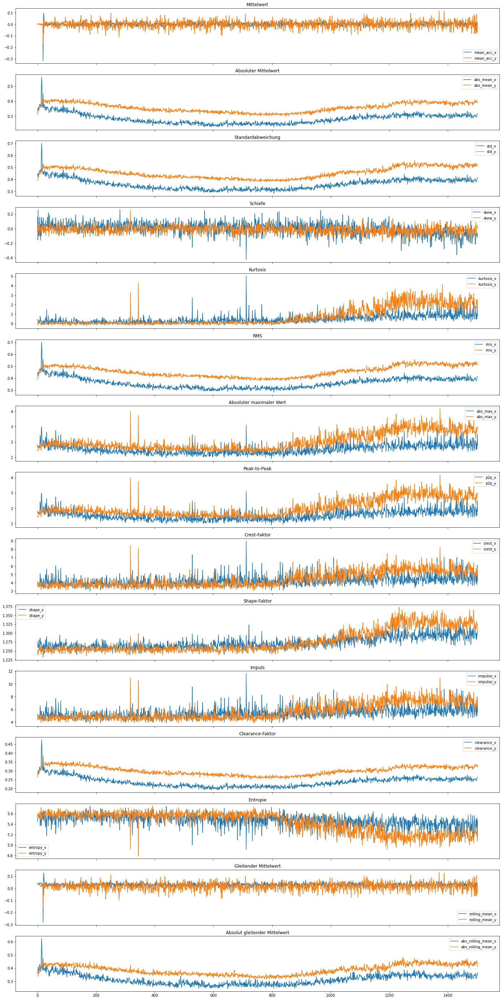

In [21]:
plot_signal_params(data, figsize=(24, 50))

<h3>Condition 2</h3>

<h5>Bearing 2_1 (Lernset)</h5>

In [22]:
file = os.path.join(path, 'Learning_set', 'Bearing2_1')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing2_1'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 83.00168442726135

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y       std_x       std_y  \
count  911.000000  911.000000  911.000000  911.000000  911.000000  911.000000   
mean     0.001529    0.001418    0.486402    0.579867    0.621645    0.744432   
std      0.015025    0.011519    0.137626    0.209834    0.201459    0.274095   
min     -0.051372   -0.040734    0.031237    0.050918    0.037000    0.063340   
25%     -0.008700   -0.006773    0.445561    0.554218    0.565498    0.708639   
50%      0.002014    0.001381    0.475259    0.601577    0.602693    0.770866   
75%      0.011835    0.009403    0.518232    0.651217    0.664920    0.838658   
max      0.046592    0.041217    1.654483    1.806759    2.702248    2.621175   

           skew_x      skew_y  kurtosis_x  kurtosis_y  ...   impulse_x  \
count  911.000000  911.000000  911.000000  911.000000  ...  911.000000   
mean    -0.055762   -0.001661    0.847292    1.759250  ...    5.586041   
std      

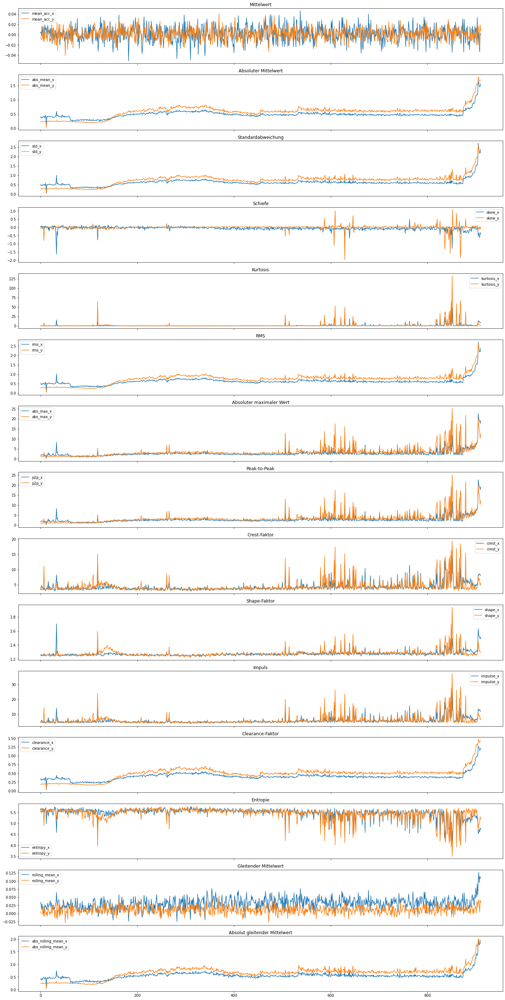

In [23]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 2_2 (Lernset)</h5>

In [24]:
file = os.path.join(path, 'Learning_set', 'Bearing2_2')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing2_2'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 72.83188152313232

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y       std_x       std_y  \
count  797.000000  797.000000  797.000000  797.000000  797.000000  797.000000   
mean     0.001368    0.000604    0.449689    0.661523    0.578620    0.857950   
std      0.017819    0.037876    0.157275    0.298653    0.218080    0.392728   
min     -0.157602   -0.181074    0.201702    0.152927    0.253052    0.189650   
25%     -0.008478   -0.022891    0.288923    0.378532    0.363873    0.496825   
50%      0.001788    0.000843    0.453707    0.661557    0.580934    0.862555   
75%      0.011323    0.022943    0.547717    0.871433    0.697754    1.139993   
max      0.109990    0.138955    1.269656    1.724104    1.974111    2.695834   

           skew_x      skew_y  kurtosis_x  kurtosis_y  ...   impulse_x  \
count  797.000000  797.000000  797.000000  797.000000  ...  797.000000   
mean    -0.106586    0.013543    0.694433    0.753949  ...    5.456474   
std      

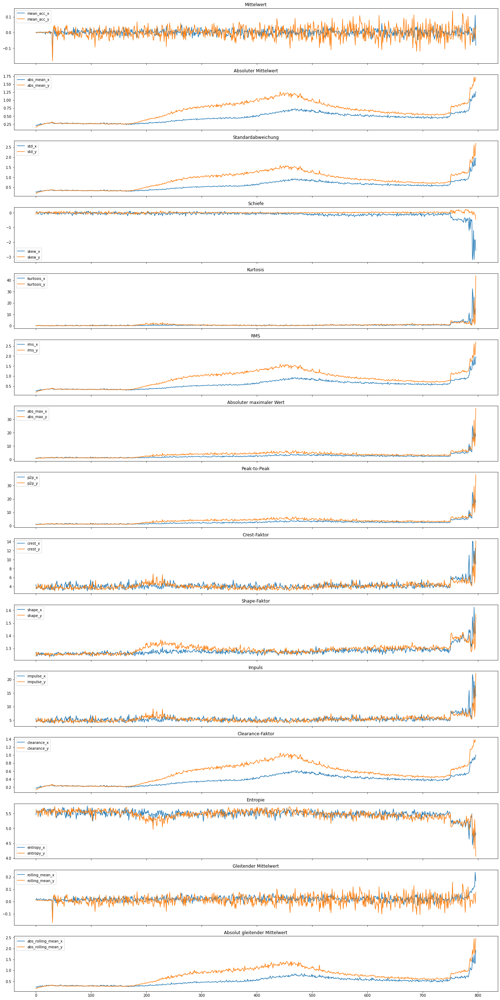

In [25]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 2_3 (Testset)</h5>

In [26]:
file = os.path.join(path, 'Test_set', 'Bearing2_3')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_3'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 111.2135808467865

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y        std_x  \
count  1202.000000  1202.000000  1202.000000  1202.000000  1202.000000   
mean      0.001351     0.001531     0.275764     0.239383     0.365283   
std       0.009010     0.013081     0.084452     0.044175     0.129177   
min      -0.025892    -0.051749     0.187824     0.194805     0.238024   
25%      -0.004192    -0.005153     0.212071     0.216810     0.269957   
50%       0.001404     0.001238     0.230107     0.227251     0.302590   
75%       0.006906     0.008021     0.336031     0.245533     0.443926   
max       0.116197     0.167738     0.524716     0.491130     0.949000   

             std_y       skew_x       skew_y   kurtosis_x   kurtosis_y  ...  \
count  1202.000000  1202.000000  1202.000000  1202.000000  1202.000000  ...   
mean      0.374666     0.007918    -0.223066     4.521544    28.768167  ...   
std       0.235271     0.419831     1.123261    11.194557

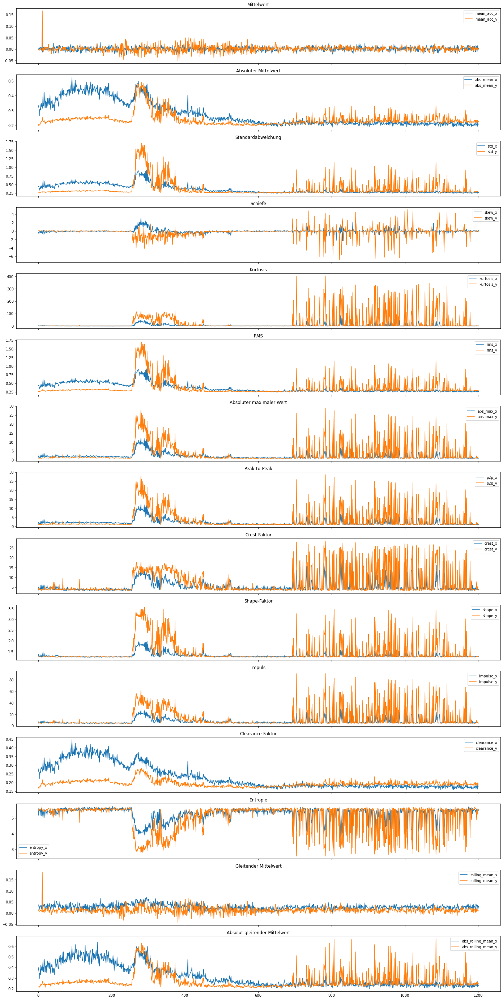

In [27]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 2_4 (Testset)</h5>

In [28]:
file = os.path.join(path, 'Test_set', 'Bearing2_4')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_4'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 58.30589413642883

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y       std_x       std_y  \
count  612.000000  612.000000  612.000000  612.000000  612.000000  612.000000   
mean     0.000698    0.001030    0.270086    0.228514    0.342547    0.288813   
std      0.015642    0.007565    0.024567    0.010216    0.033676    0.017121   
min     -0.052120   -0.021539    0.214305    0.191142    0.271808    0.238874   
25%     -0.008757   -0.003348    0.250234    0.221577    0.316322    0.278874   
50%      0.000406    0.001120    0.272093    0.229191    0.346639    0.288107   
75%      0.009656    0.005631    0.287933    0.235076    0.365182    0.296071   
max      0.062275    0.029363    0.386664    0.270695    0.619403    0.417321   

           skew_x      skew_y  kurtosis_x  kurtosis_y  ...   impulse_x  \
count  612.000000  612.000000  612.000000  612.000000  ...  612.000000   
mean    -0.115057   -0.037496    0.718707    0.460147  ...    5.544948   
std      

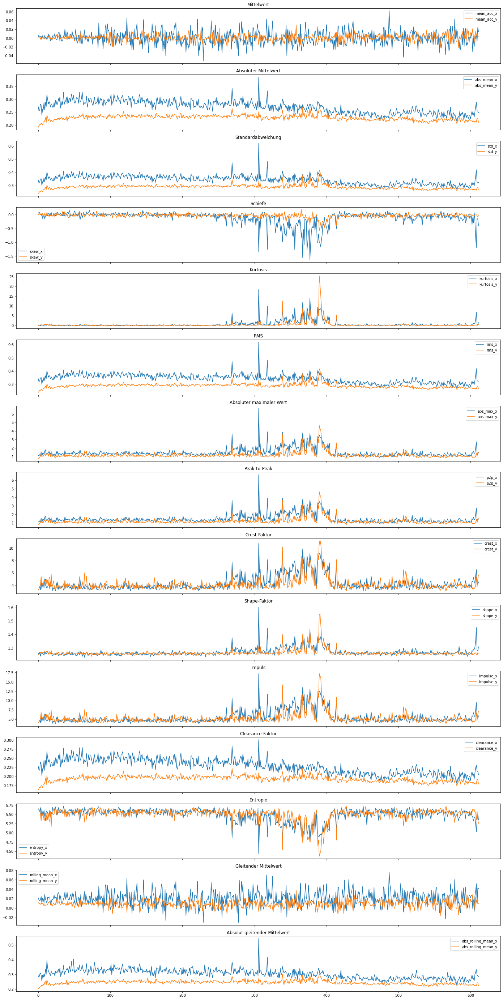

In [29]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 2_5 (Testset)</h5>

In [30]:
file = os.path.join(path, 'Test_set', 'Bearing2_5')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_5'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 187.83992171287537

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y        std_x  \
count  2002.000000  2002.000000  2002.000000  2002.000000  2002.000000   
mean      0.001016     0.002088     0.287560     0.307856     0.364162   
std       0.030111     0.006979     0.125123     0.039921     0.153389   
min      -0.602544    -0.035668     0.194455     0.179776     0.245888   
25%      -0.008212    -0.002073     0.221542     0.292140     0.280223   
50%       0.001467     0.002174     0.234272     0.298144     0.296560   
75%       0.011674     0.006286     0.279899     0.306915     0.361925   
max       0.331489     0.025298     1.769630     0.512138     2.033616   

             std_y       skew_x       skew_y   kurtosis_x   kurtosis_y  ...  \
count  2002.000000  2002.000000  2002.000000  2002.000000  2002.000000  ...   
mean      0.390850    -0.099812    -0.003156     0.489411     0.355555  ...   
std       0.053406     0.201331     0.058291     1.16108

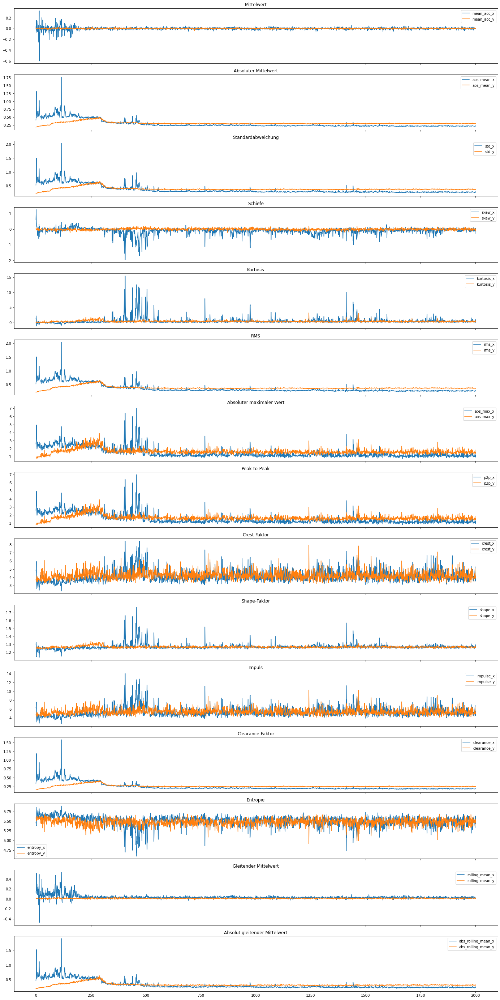

In [31]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 2_6 (Testset)</h5>

In [32]:
file = os.path.join(path, 'Test_set', 'Bearing2_6')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_6'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 51.14530682563782

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y       std_x       std_y  \
count  572.000000  572.000000  572.000000  572.000000  572.000000  572.000000   
mean     0.001432    0.001396    0.197454    0.266803    0.247737    0.334925   
std      0.020882    0.005669    0.032070    0.014826    0.040347    0.019615   
min     -0.065017   -0.012577    0.155820    0.236358    0.194263    0.295431   
25%     -0.011395   -0.001947    0.171939    0.254679    0.216398    0.319770   
50%      0.000728    0.001233    0.182144    0.263544    0.229058    0.330751   
75%      0.014546    0.004547    0.227200    0.277416    0.285494    0.348022   
max      0.120718    0.064133    0.281031    0.308312    0.353354    0.490073   

           skew_x      skew_y  kurtosis_x  kurtosis_y  ...   impulse_x  \
count  572.000000  572.000000  572.000000  572.000000  ...  572.000000   
mean    -0.072552    0.010521    0.156877    0.208416  ...    5.002557   
std      

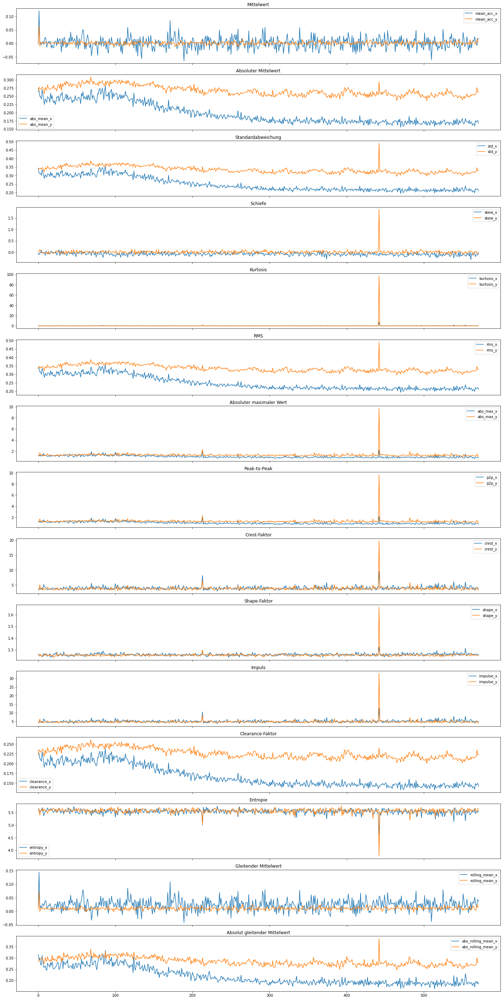

In [33]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 2_7 (Testset)</h5>

In [34]:
file = os.path.join(path, 'Test_set', 'Bearing2_7')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing2_7'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 17.451171159744263

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y       std_x       std_y  \
count  172.000000  172.000000  172.000000  172.000000  172.000000  172.000000   
mean    -0.001224    0.000166    0.274262    0.302116    0.348023    0.392348   
std      0.012511    0.006974    0.019330    0.015196    0.027724    0.084269   
min     -0.040854   -0.017537    0.239182    0.276061    0.301107    0.347579   
25%     -0.009054   -0.004601    0.261832    0.293134    0.329662    0.367963   
50%     -0.001347    0.000464    0.270906    0.299588    0.343183    0.377006   
75%      0.006614    0.005285    0.282386    0.308606    0.357927    0.388104   
max      0.036081    0.023558    0.335238    0.396446    0.466911    1.109560   

           skew_x      skew_y  kurtosis_x  kurtosis_y  ...   impulse_x  \
count  172.000000  172.000000  172.000000  172.000000  ...  172.000000   
mean    -0.077190   -0.036960    1.578364    5.152716  ...    5.815120   
std     

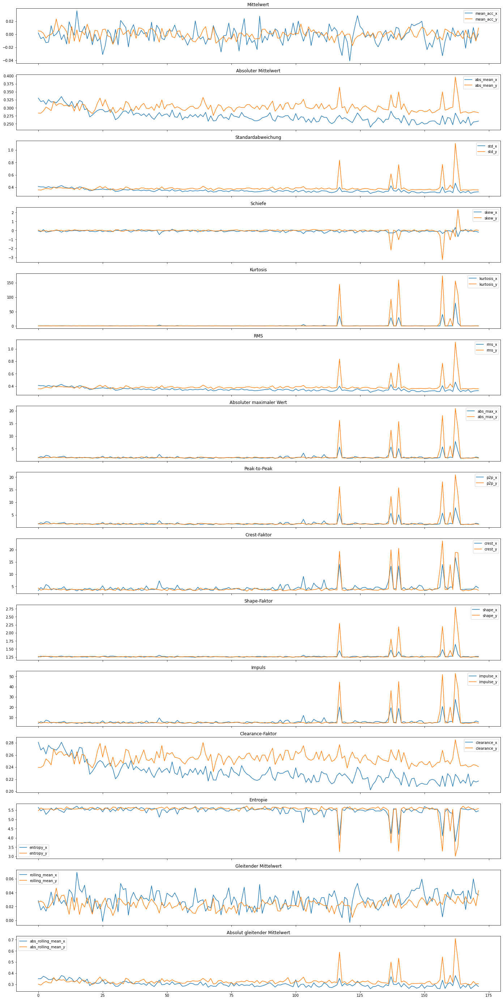

In [35]:
plot_signal_params(data, figsize=(24, 50))

<h3>Condition 3</h3>

<h5>Bearing 3_1 (Lernset)</h5>

In [36]:
file = os.path.join(path, 'Learning_set', 'Bearing3_1')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing3_1'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 43.406548738479614

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y       std_x       std_y  \
count  515.000000  515.000000  515.000000  515.000000  515.000000  515.000000   
mean     0.002554    0.001407    0.261587    0.280235    0.344219    0.358262   
std      0.039295    0.023150    0.096867    0.174087    0.153451    0.231858   
min     -0.259387   -0.043793    0.177279    0.211002    0.223835    0.264994   
25%     -0.012038   -0.006276    0.221504    0.235380    0.286315    0.299280   
50%      0.001576    0.000519    0.234017    0.245458    0.307500    0.311632   
75%      0.014329    0.006764    0.252721    0.254236    0.336803    0.321663   
max      0.652714    0.433591    0.781998    1.200605    2.443424    1.676773   

           skew_x      skew_y  kurtosis_x  kurtosis_y  ...   impulse_x  \
count  515.000000  515.000000  515.000000  515.000000  ...  515.000000   
mean    -0.008343   -0.022528    3.152162    0.937009  ...    7.062796   
std     

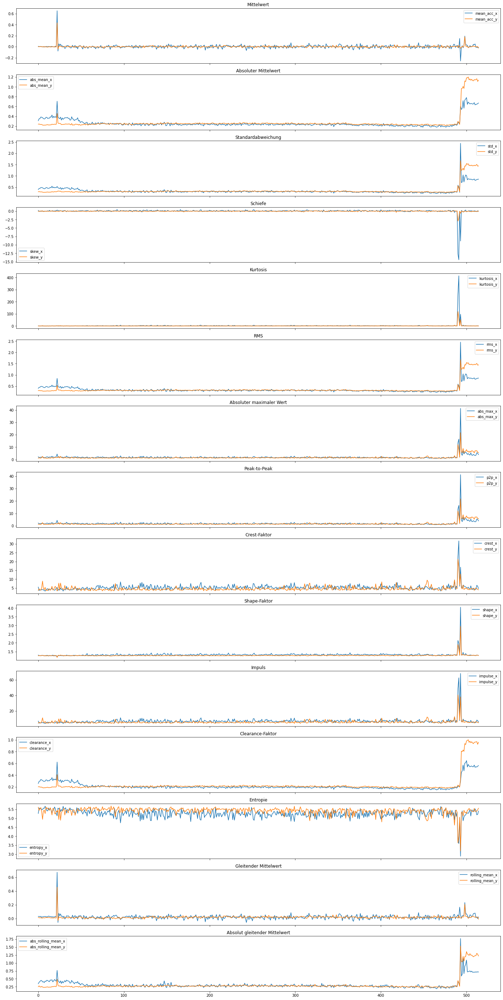

In [37]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 3_2 (Lernset)</h5>

In [38]:
file = os.path.join(path, 'Learning_set', 'Bearing3_2')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=learning_sets['Bearing3_2'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 137.16840195655823

        mean_acc_x   mean_acc_y   abs_mean_x   abs_mean_y        std_x  \
count  1637.000000  1637.000000  1637.000000  1637.000000  1637.000000   
mean      0.001202     0.000836     0.248001     0.247874     0.327356   
std       0.020518     0.014014     0.095112     0.121872     0.142430   
min      -0.062380    -0.082077     0.041523     0.100171     0.048712   
25%      -0.012155    -0.008148     0.218582     0.217156     0.284400   
50%       0.000641     0.000741     0.231811     0.224088     0.305683   
75%       0.013503     0.009111     0.248652     0.237918     0.330020   
max       0.144030     0.102328     1.562205     1.727692     2.368625   

             std_y       skew_x       skew_y   kurtosis_x   kurtosis_y  ...  \
count  1637.000000  1637.000000  1637.000000  1637.000000  1637.000000  ...   
mean      0.320591    -0.104252    -0.011854     2.115381     2.191587  ...   
std       0.168002     0.179615     0.208766     3.35804

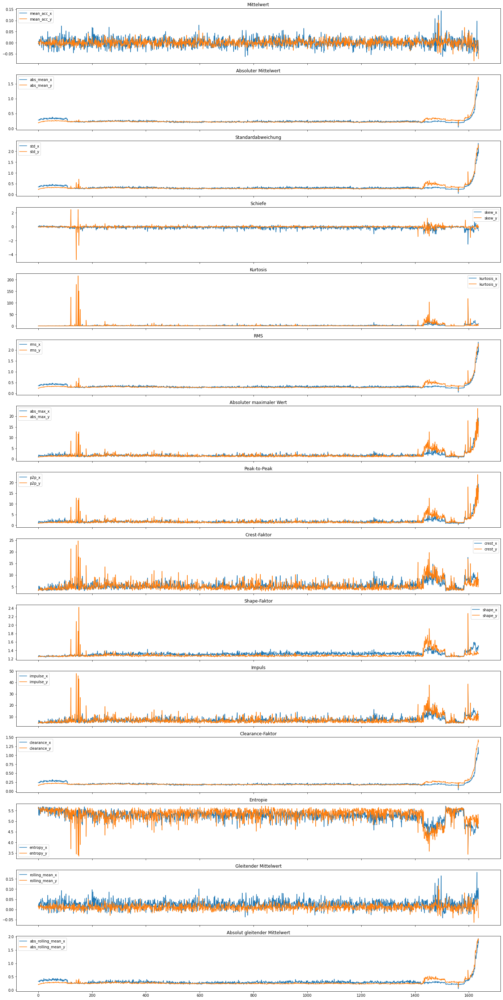

In [39]:
plot_signal_params(data, figsize=(24, 50))

<h5>Bearing 3_3 (Testset)</h5>

In [40]:
file = os.path.join(path, 'Test_set', 'Bearing3_3')

# Zeit der Ausführung stoppen
start = time.time()
data = read_bearing_measurements(file, start=1, end=test_sets['Bearing3_3'])
end = time.time()
print("Execution Time [s]:", end - start, end='\n\n')
print_df_infos(data)

Execution Time [s]: 29.408299684524536

       mean_acc_x  mean_acc_y  abs_mean_x  abs_mean_y       std_x       std_y  \
count  352.000000  352.000000  352.000000  352.000000  352.000000  352.000000   
mean    -0.001339    0.001153    0.218218    0.314970    0.274524    0.400398   
std      0.039234    0.020917    0.041954    0.083684    0.054189    0.116803   
min     -0.127345   -0.090010    0.166369    0.229408    0.210468    0.288028   
25%     -0.024277   -0.010300    0.194667    0.271070    0.244556    0.339973   
50%     -0.002682    0.001817    0.206600    0.292713    0.260417    0.367233   
75%      0.026421    0.015467    0.224904    0.320665    0.281106    0.405869   
max      0.122324    0.087431    0.408488    0.687730    0.510448    0.905334   

           skew_x      skew_y  kurtosis_x  kurtosis_y  ...   impulse_x  \
count  352.000000  352.000000  352.000000  352.000000  ...  352.000000   
mean    -0.020099    0.012146    0.435915    0.337877  ...    5.421742   
std     

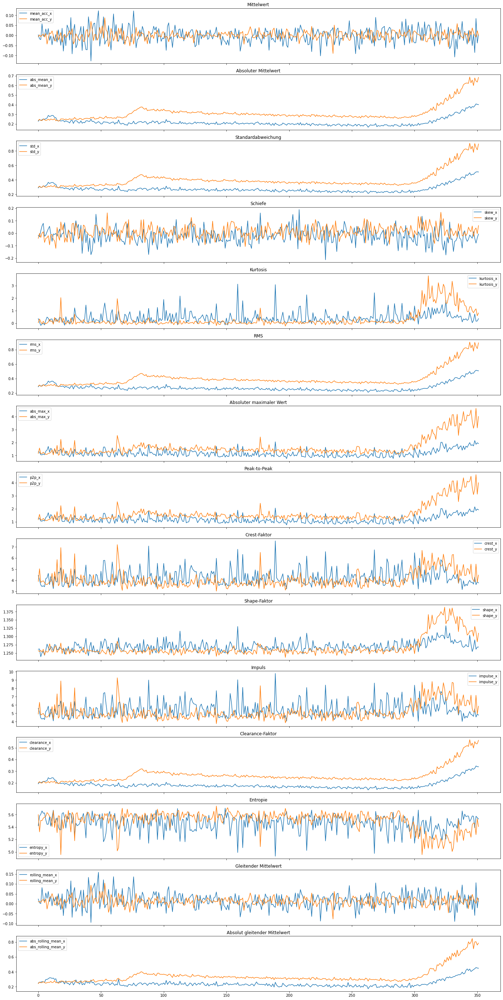

In [41]:
plot_signal_params(data, figsize=(24, 50))